In [190]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score

In [191]:
posts_csv = './images.csv'

data = pd.read_csv(posts_csv)

In [192]:
X = data['text']
y = data['advertisement']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

print(X_train.shape, X_test.shape)

(58,) (15,)


In [193]:
count_vector = CountVectorizer()
count_vector.fit(X_train)

X_train_count_vector = count_vector.transform(X_train)
X_test_count_vector = count_vector.transform(X_test)

In [194]:
decision_tree_classifier = DecisionTreeClassifier(max_depth=10)
ada_boost_classifier = AdaBoostClassifier(estimator=decision_tree_classifier, n_estimators=50, algorithm='SAMME')
ada_boost_classifier.fit(X_train_count_vector, y_train)

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=10))

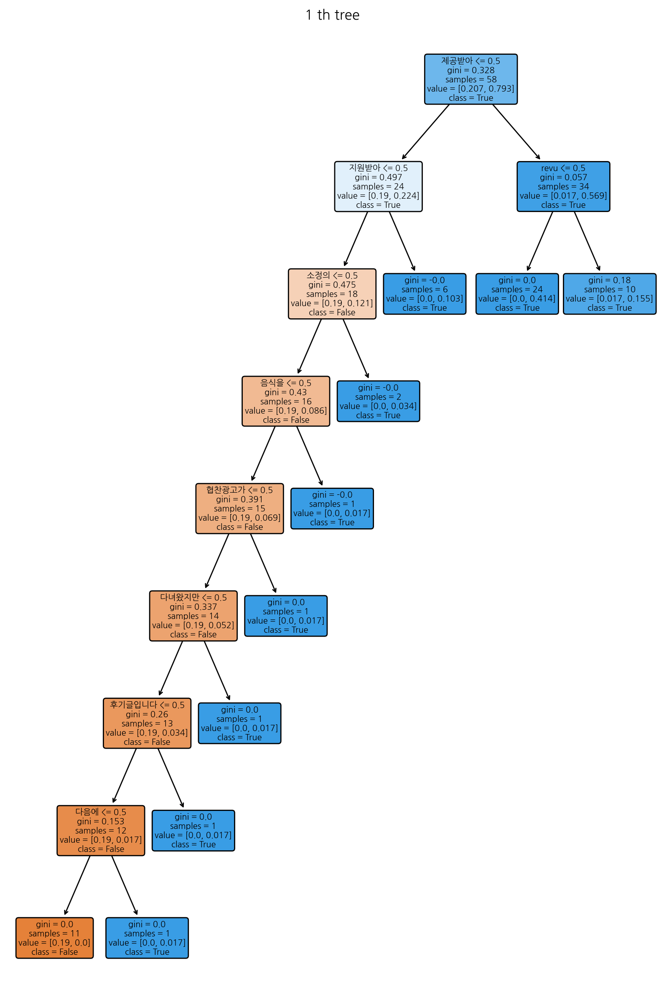

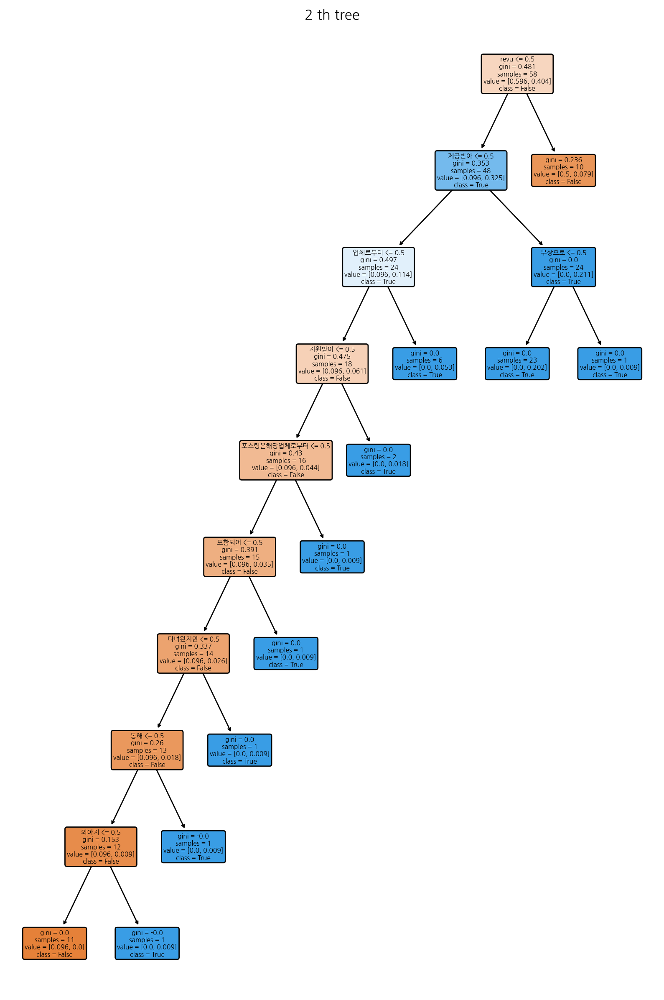

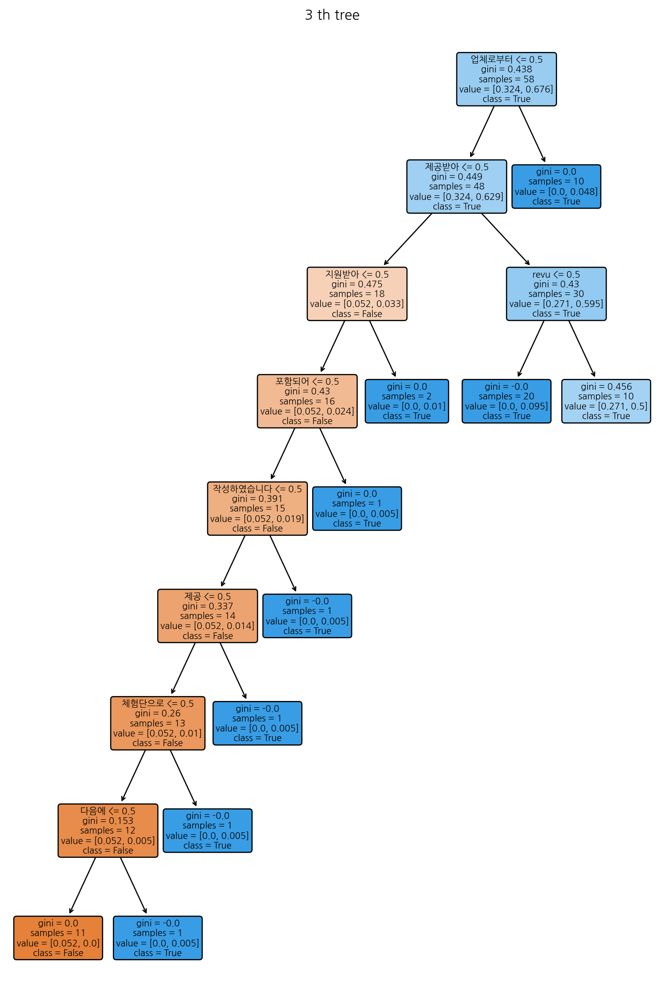

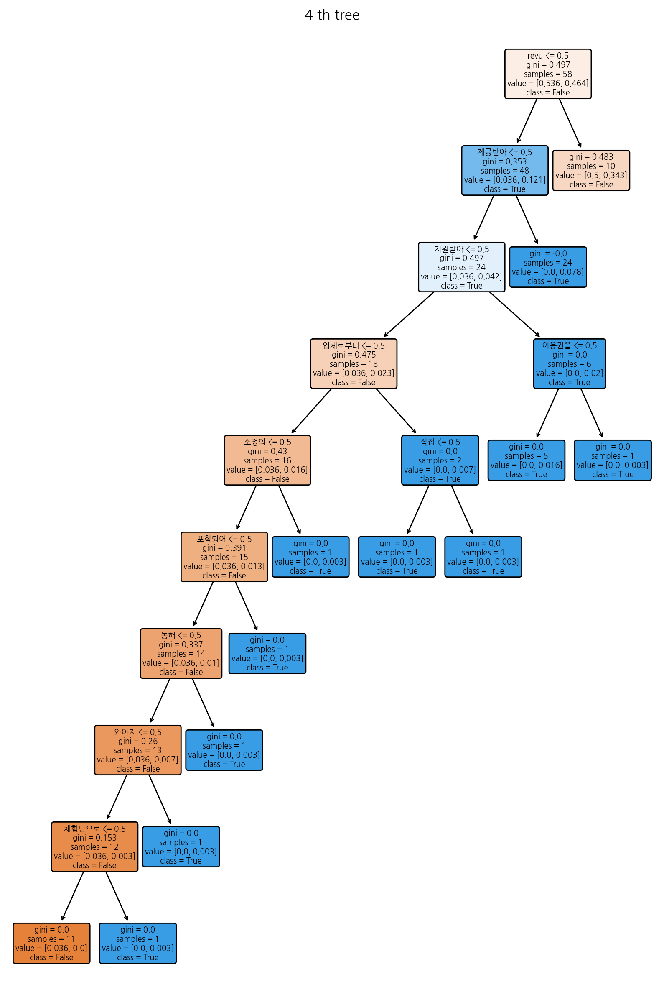

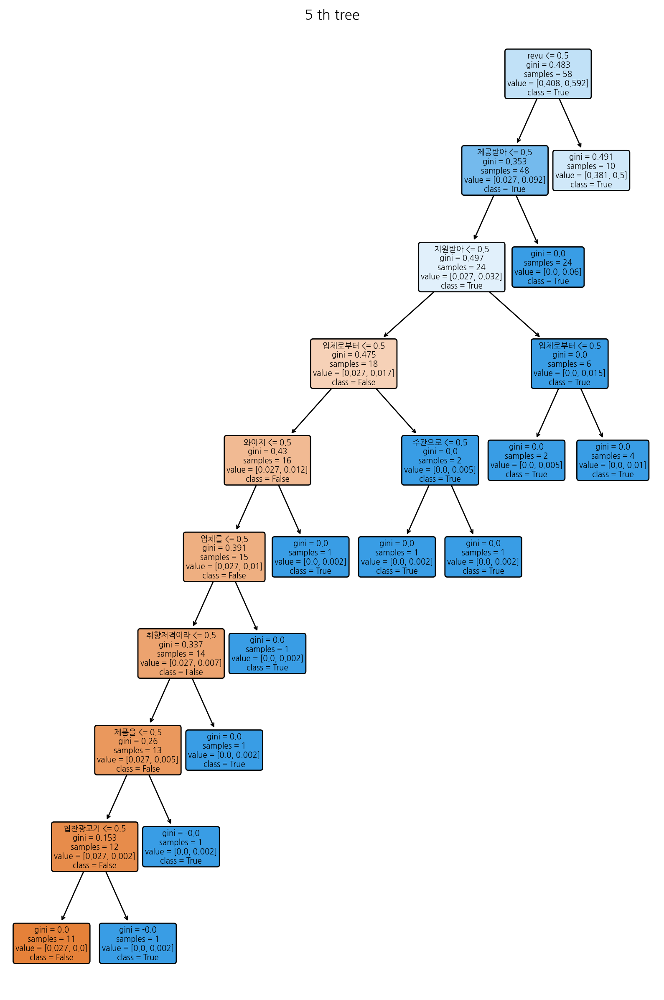

...

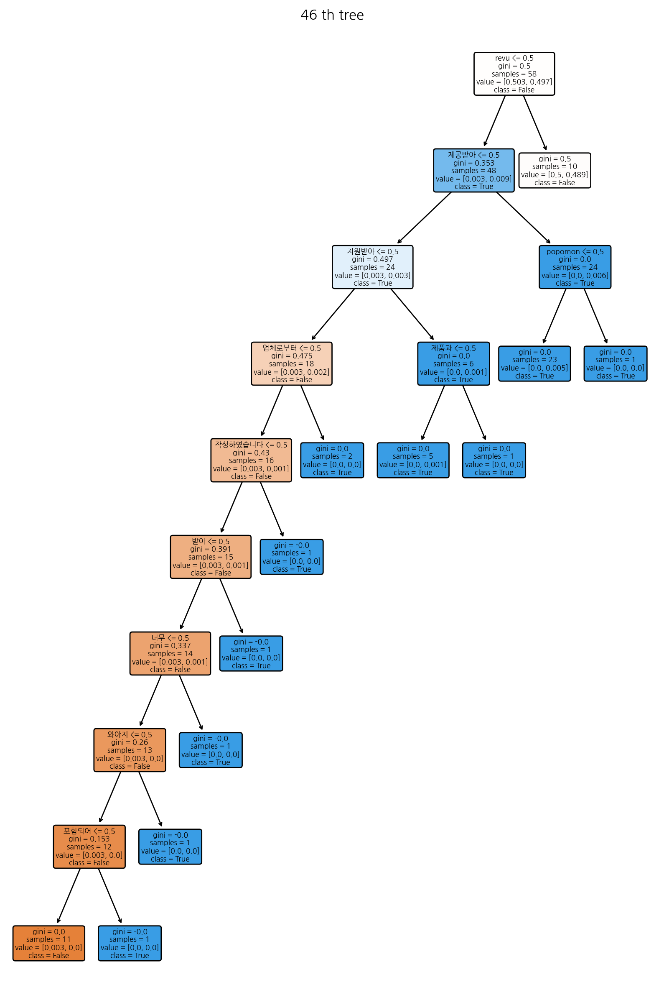

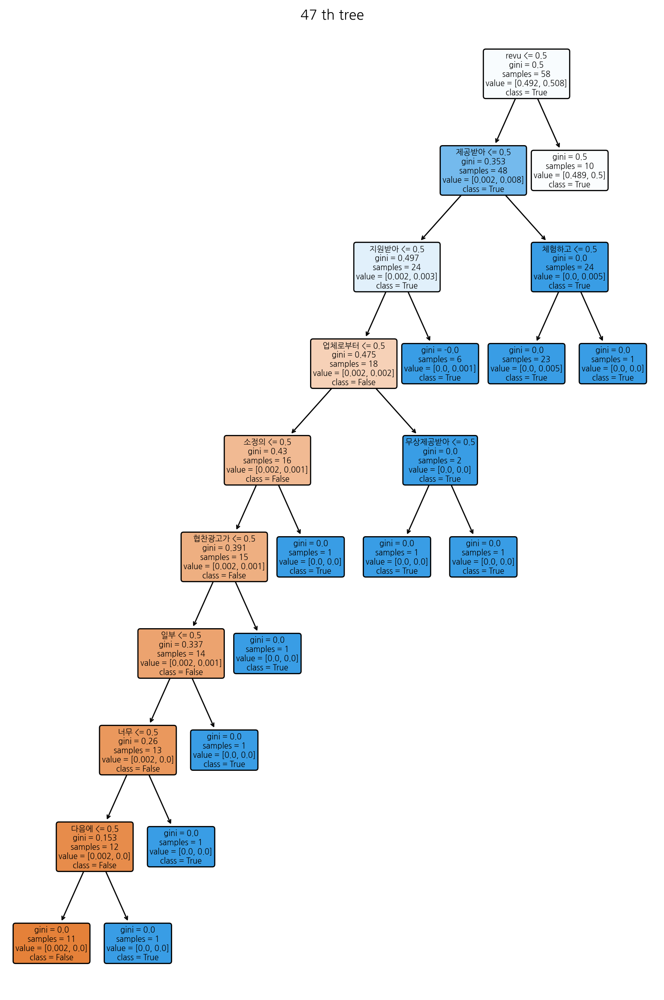

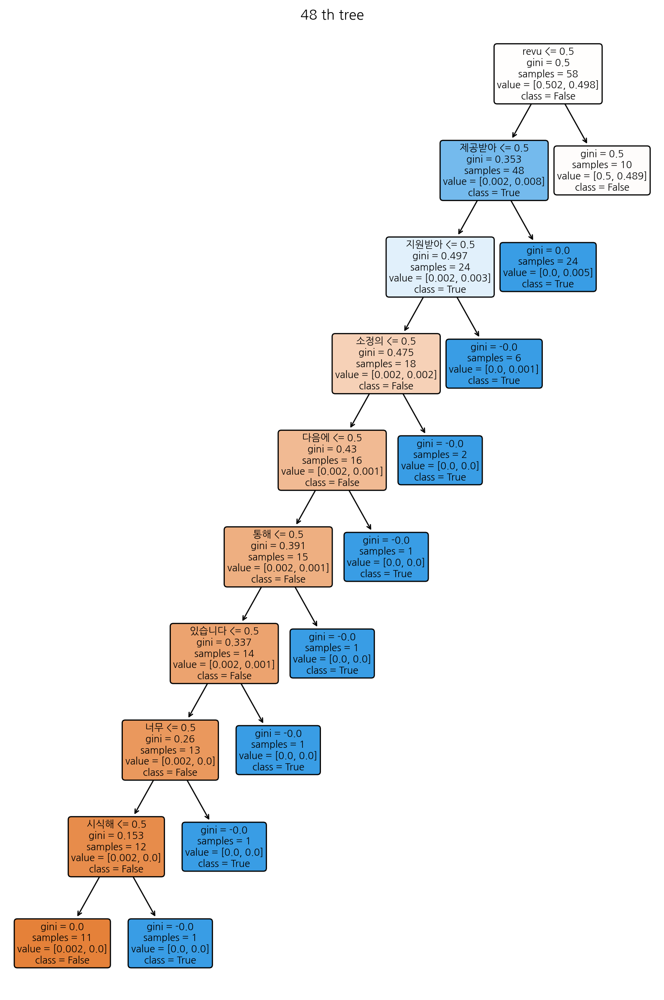

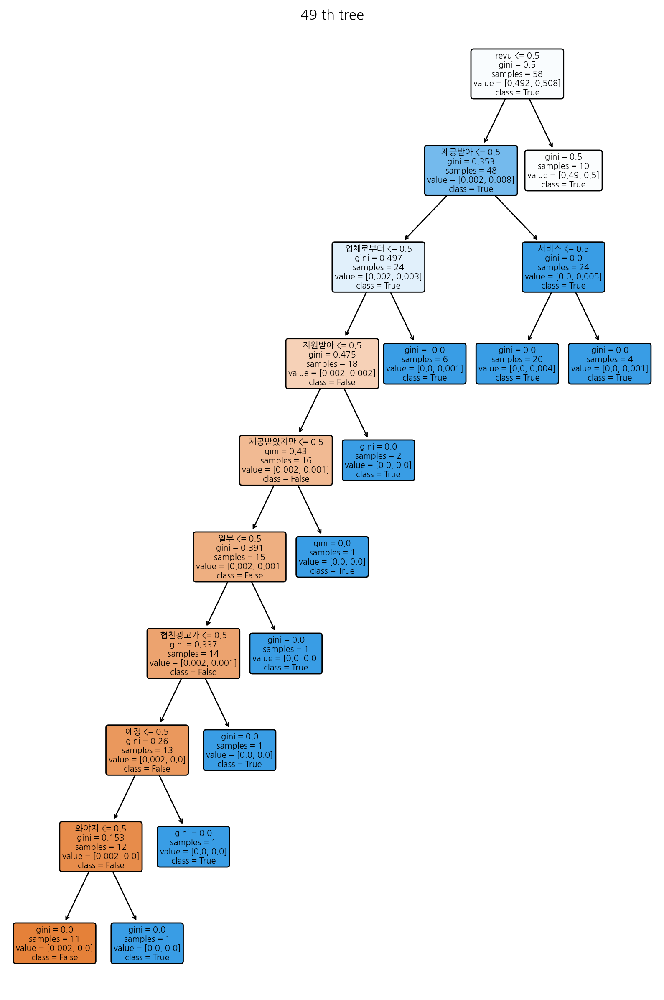

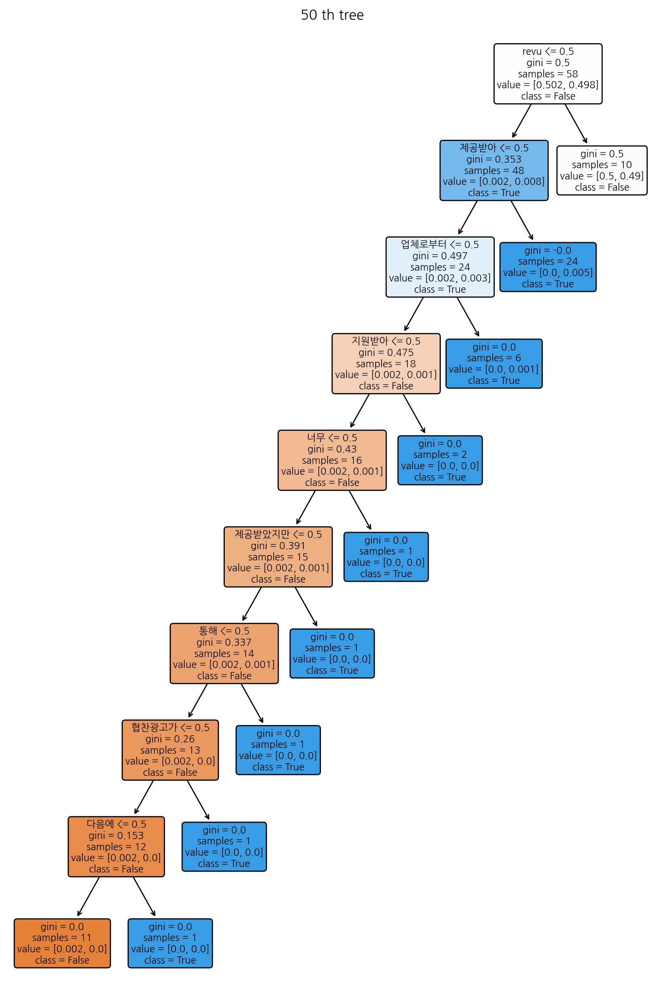

In [198]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import koreanize_matplotlib

%config InlineBackend.figure_format = 'retina'

# 트리 시각화
n_estimator = len(ada_boost_classifier.estimators_)

feature_names_list = count_vector.get_feature_names_out().tolist()

for i in range(n_estimator):
    fig = plt.figure(figsize=(10, 15), facecolor='white')
    ax = fig.add_subplot(111)
    plot_tree(ada_boost_classifier.estimators_[i],
              feature_names=feature_names_list,
              class_names=[str(cls) for cls in ada_boost_classifier.classes_],
              ax=ax,
              filled=True,
              rounded=True)
    ax.set_title(f'{i+1} th tree')
    plt.show()


0 번째 트리 정확도 : 0.9827586206896551
1 번째 트리 정확도 : 0.9827586206896551
2 번째 트리 정확도 : 0.9827586206896551
3 번째 트리 정확도 : 0.9827586206896551
4 번째 트리 정확도 : 0.9827586206896551
5 번째 트리 정확도 : 0.9827586206896551
6 번째 트리 정확도 : 0.9827586206896551
7 번째 트리 정확도 : 0.9827586206896551
8 번째 트리 정확도 : 0.9827586206896551
9 번째 트리 정확도 : 0.9827586206896551
10 번째 트리 정확도 : 0.9827586206896551
11 번째 트리 정확도 : 0.9827586206896551
12 번째 트리 정확도 : 0.9827586206896551
13 번째 트리 정확도 : 0.9827586206896551
14 번째 트리 정확도 : 0.9827586206896551
15 번째 트리 정확도 : 0.9827586206896551
16 번째 트리 정확도 : 0.9827586206896551
17 번째 트리 정확도 : 0.9827586206896551
18 번째 트리 정확도 : 0.9827586206896551
19 번째 트리 정확도 : 0.9827586206896551
20 번째 트리 정확도 : 0.9827586206896551
21 번째 트리 정확도 : 0.9827586206896551
22 번째 트리 정확도 : 0.9827586206896551
23 번째 트리 정확도 : 0.9827586206896551
24 번째 트리 정확도 : 0.9827586206896551
25 번째 트리 정확도 : 0.9827586206896551
26 번째 트리 정확도 : 0.9827586206896551
27 번째 트리 정확도 : 0.9827586206896551
28 번째 트리 정확도 : 0.9827586206896551
29 번째 트리 정확도 : 0.9827586

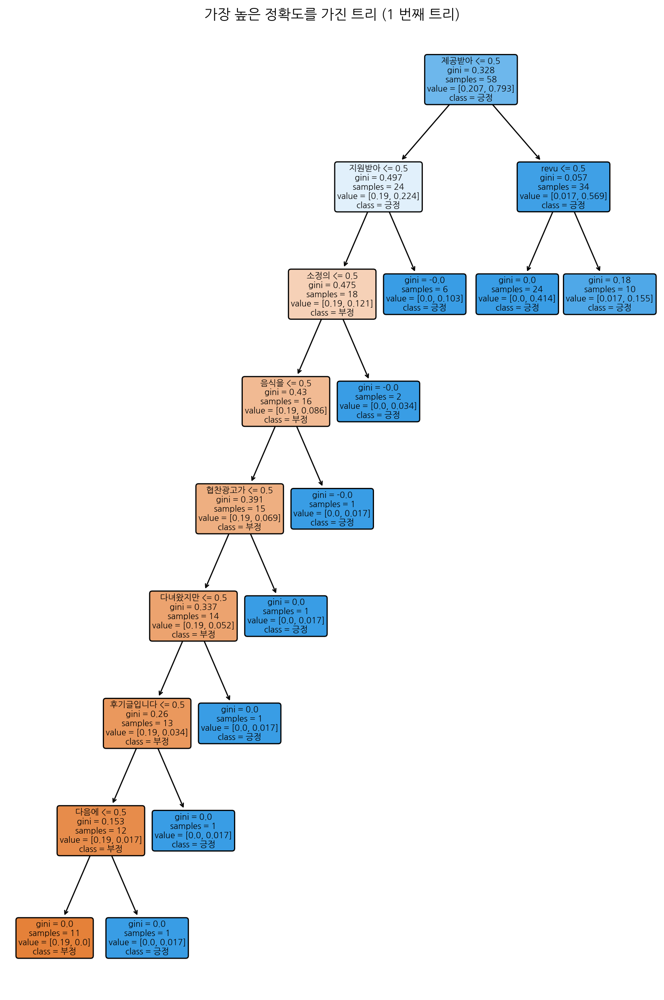

In [199]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import koreanize_matplotlib

%config InlineBackend.figure_format = 'retina'


# 각 트리의 정확도를 측정
accuracies = []
for i, y_pred in enumerate(ada_boost_classifier.staged_predict(X_train_count_vector)):
    accuracy = accuracy_score(y_train, list(y_pred))
    print(i, "번째 트리 정확도 :", accuracy)
    accuracies.append(accuracy)

# 가장 높은 정확도를 가진 트리의 인덱스를 찾음
best_tree_index = accuracies.index(max(accuracies))

# 가장 높은 정확도를 가진 트리만 시각화
fig = plt.figure(figsize=(10, 15), facecolor='white')
ax = fig.add_subplot(111)

feature_names_list = count_vector.get_feature_names_out().tolist()
class_labels_korean = ["부정", "긍정"]

plot_tree(ada_boost_classifier.estimators_[best_tree_index],
          feature_names=feature_names_list,
          class_names=class_labels_korean,
          ax=ax,
          filled=True,
          rounded=True)
ax.set_title(f'가장 높은 정확도를 가진 트리 ({best_tree_index + 1} 번째 트리)')
plt.show()

In [200]:
prediction = ada_boost_classifier.predict(X_test_count_vector)
accuracy = accuracy_score(y_test, prediction)
print("Decision Tree 기반의 Ada Boosting 정확도 :", accuracy)

Decision Tree 기반의 Ada Boosting 정확도 : 0.9333333333333333


In [201]:
scores = cross_val_score(ada_boost_classifier, X_train_count_vector, y_train, cv=5)
print("cross-validation 평균 정확도 :", np.mean(scores))
print("cross-validation 최대 정확도 :", np.max(scores))

cross-validation 평균 정확도 : 0.8454545454545455
cross-validation 최대 정확도 : 1.0


In [202]:
logistic_regression = LogisticRegression()
logistic_regression.fit(X_train_count_vector, y_train)

LogisticRegression()

In [203]:
prediction = logistic_regression.predict(X_test_count_vector)
accuracy = accuracy_score(y_test, prediction)
print("Lostistic Regression")
print("test set 정확도 :", accuracy)

Lostistic Regression
test set 정확도 : 1.0


In [204]:
scores = cross_val_score(logistic_regression, X_train_count_vector, y_train, cv=5)
print("cross-validation 평균 정확도 :", np.mean(scores))
print("cross-validation 최대 정확도 :", np.max(scores))

cross-validation 평균 정확도 : 0.8984848484848484
cross-validation 최대 정확도 : 1.0
